## Pre-Entrega del proyecto final - Maximiliano Ramirez - Obtención de insights a partir de visualizaciones

kdeplot

feature selector

# 1 - Abstracto

El proyecto busca generar un modelo de interpretación de datos de terremotos, estos entendidos como movimientos sismicos de magnitudes significativas y que podrian provocar daños. La motivación radica en la busqueda de patrones o tendencias que permitan establecer niveles de riesgo geológicos y temporales. Estos niveles de riesgo pueden ayudar a programas de prevención y educación sísmica, e incluso a organismos de emergencia, tanto para actividades preventivas como formativas.

# 2 - Preguntas e hipótesis

El interés por los terremotos es atemporal, su carácter y naturaleza violenta han mantenido ocupada a la ciencia, ingeniería, economía, y muchas otras disciplinas. Aún existe gran interés en comprender las causas y variables de interés que se relacionan con los terremotos, y las tecnologías empleadas para registrar cada movimiento sísmico nos permiten obtener datos desde cientos de sensores al unísono, con ello obteniendo un registro de gran calidad de cada evento, que incluye incluso metadatos de las fuentes y errores.


El presente estudio busca evidenciar el entrelazamiento de variables dentro de la data histórica de registros, esto mediante tres preguntas en las que asociaremos la magnitud con la ubicación, la fecha, y la profundidad, todo esto utilizando una selección de terremotos históricos con magnitudes mayores a 5.5 ,y por lo tanto significativos.

El objetivo del análisis es comprender las posibles relaciones entre las variables físicas, geográficas y temporales relacionadas con los terremotos. Y para ello se plantean tres preguntas:

Primera pregunta: ¿existe una relación evidente entre la magnitud y la fecha?

Segunda pregunta: ¿Existe una relación entre la magnitud y la ubicación (latitud y longitud)?

Tercera Pregunta: ¿Existe una relación entre la magnitud y la profundidad?

A modo de hipotesis se plantea que si podrian existir relaciones, aunque no se conoce que tan explicitas sean dichas relaciones.

#3 - Análisis exploratorio de datos (EDA)

El primer paso será obtener y preparar los datos, instalando librerías adicionales incluso.

*La data es obtenida a traves de la plataforma kaggle, y se titula Significant Earthquakes 1965-2016, y que incluye movimientos de caracter significativo.*
(https://www.kaggle.com/datasets/usgs/earthquake-database)




In [1]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     - 22.6 MB 20.4 MB/s 0:00:02
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 1.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 21.3 MB/s eta 0:00:00
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=356305 sha256=8272faa78f4b1905122f3ad63d035bdab212000474fb458ed5b2df5ef397904e
  Stored in directory: /tmp/pip-ephem-wheel-cache-j3oq8l38/wheels/07/29/61/f533cc7cbd0a97efb2d1b94d3254a3e859a949367ba842577b
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27079 sha256=1b3b4734a5473095d1994b6bdfe80e1f9356228b84c85c16886df57c42767dd6
  Stored in directory: /roo

In [2]:
#Importación de librerias
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import folium
import pandas_profiling
from sklearn import preprocessing
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
from sklearn.preprocessing import OneHotEncoder

<ipython-input-2-eca7a19f5995>:8: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


In [3]:
#Carga de archivo
url = 'https://drive.google.com/file/d/1o-4Yk2xO4dG0RQ8Ih9nCiqKWSUJB9LhQ/view?usp=share_link'
path = 'https://drive.google.com/uc?export=download&id='+url.split('/')[-2]
df = pd.read_csv(path)

In [4]:
#Información de las columnas de la base de datos
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23412 entries, 0 to 23411
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Date                        23412 non-null  object 
 1   Time                        23412 non-null  object 
 2   Latitude                    23412 non-null  float64
 3   Longitude                   23412 non-null  float64
 4   Type                        23412 non-null  object 
 5   Depth                       23412 non-null  float64
 6   Depth Error                 4461 non-null   float64
 7   Depth Seismic Stations      7097 non-null   float64
 8   Magnitude                   23412 non-null  float64
 9   Magnitude Type              23409 non-null  object 
 10  Magnitude Error             327 non-null    float64
 11  Magnitude Seismic Stations  2564 non-null   float64
 12  Azimuthal Gap               7299 non-null   float64
 13  Horizontal Distance         160

In [5]:
df.head()

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
0,01/02/1965,13:44:18,19.246,145.616,Earthquake,131.6,NaN,NaN,6.0,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic
1,01/04/1965,11:29:49,1.863,127.352,Earthquake,80.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic
2,01/05/1965,18:05:58,-20.579,-173.972,Earthquake,20.0,NaN,NaN,6.2,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic
3,01/08/1965,18:49:43,-59.076,-23.557,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic
4,01/09/1965,13:32:50,11.938,126.427,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic


In [6]:
df.tail()

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
23407,12/28/2016,08:22:12,38.3917,-118.8941,Earthquake,12.30,1.2,40.0,5.6,ML,...,18.0,42.47,0.120,NaN,0.1898,NN00570710,NN,NN,NN,Reviewed
23408,12/28/2016,09:13:47,38.3777,-118.8957,Earthquake,8.80,2.0,33.0,5.5,ML,...,18.0,48.58,0.129,NaN,0.2187,NN00570744,NN,NN,NN,Reviewed
23409,12/28/2016,12:38:51,36.9179,140.4262,Earthquake,10.00,1.8,NaN,5.9,MWW,...,NaN,91.00,0.992,4.8,1.5200,US10007NAF,US,US,US,Reviewed
23410,12/29/2016,22:30:19,-9.0283,118.6639,Earthquake,79.00,1.8,NaN,6.3,MWW,...,NaN,26.00,3.553,6.0,1.4300,US10007NL0,US,US,US,Reviewed
23411,12/30/2016,20:08:28,37.3973,141.4103,Earthquake,11.94,2.2,NaN,5.5,MB,...,428.0,97.00,0.681,4.5,0.9100,US10007NTD,US,US,US,Reviewed


In [7]:
df.describe()

,Latitude,Longitude,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Error,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square
count,23412.000000,23412.000000,23412.000000,4461.000000,7097.000000,23412.000000,327.000000,2564.000000,7299.000000,1604.000000,1156.000000,17352.000000
mean,1.679033,39.639961,70.767911,4.993115,275.364098,5.882531,0.071820,48.944618,44.163532,3.992660,7.662759,1.022784
std,30.113183,125.511959,122.651898,4.875184,162.141631,0.423066,0.051466,62.943106,32.141486,5.377262,10.430396,0.188545
min,-77.080000,-179.997000,-1.100000,0.000000,0.000000,5.500000,0.000000,0.000000,0.000000,0.004505,0.085000,0.000000
25%,-18.653000,-76.349750,14.522500,1.800000,146.000000,5.600000,0.046000,10.000000,24.100000,0.968750,5.300000,0.900000
50%,-3.568500,103.982000,33.000000,3.500000,255.000000,5.700000,0.059000,28.000000,36.000000,2.319500,6.700000,1.000000
75%,26.190750,145.026250,54.000000,6.300000,384.000000,6.000000,0.075500,66.000000,54.000000,4.724500,8.100000,1.130000
max,86.005000,179.998000,700.000000,91.295000,934.000000,9.100000,0.410000,821.000000,360.000000,37.874000,99.000000,3.440000


In [8]:
# Identificamos los datos distintos en cada columna del tipo Object
for col in df.select_dtypes(include = ["object"]).columns:
    print(f"{col}: {df[col].unique()}")

Date: ['01/02/1965' '01/04/1965' '01/05/1965' ... '12/28/2016' '12/29/2016'
 '12/30/2016']
Time: ['13:44:18' '11:29:49' '18:05:58' ... '12:38:51' '22:30:19' '20:08:28']
Type: ['Earthquake' 'Nuclear Explosion' 'Explosion' 'Rock Burst']
Magnitude Type: ['MW' 'ML' 'MH' 'MS' 'MB' 'MWC' 'MD' nan 'MWB' 'MWW' 'MWR']
ID: ['ISCGEM860706' 'ISCGEM860737' 'ISCGEM860762' ... 'US10007NAF'
 'US10007NL0' 'US10007NTD']
Source: ['ISCGEM' 'ISCGEMSUP' 'OFFICIAL' 'CI' 'US' 'NC' 'GCMT' 'UW' 'ATLAS' 'NN'
 'SE' 'AK' 'PR']
Location Source: ['ISCGEM' 'CI' 'US' 'H' 'U' 'G' 'NC' 'B' 'GCMT' 'AG' 'UW' 'SPE' 'HVO'
 'BRK' 'ATLAS' 'AGS' 'PGC' 'BOU' 'SLC' 'OTT' 'AEI' 'AEIC' 'CASC' 'ISK'
 'ATH' 'THE' 'ROM' 'MDD' 'WEL' 'GUC' 'UNM' 'CSEM' 'RSPR' 'JMA' 'NN' 'CAR'
 'SJA' 'TEH' 'BEO' 'UCR' 'SE' 'TUL' 'TAP' 'THR' 'LIM' 'US_WEL' 'AK' 'PR']
Magnitude Source: ['ISCGEM' 'OFFICIAL' 'CI' 'US' '1020' 'BRK' 'NC' '1000' 'GCMT' '1009' 'UW'
 '1023' 'ATLAS' 'HRV' 'PAR' 'NIED' 'NN' 'SE' 'PGC' 'US_GCMT' 'US_PGC' 'AK'
 'PR' 'GUC']
Status: [

In [9]:
#revisamos la proporcion de tipos dentro de la variable "Type"
Type_counts = df.Type.value_counts(normalize = True)
Type_counts

Earthquake           0.992312
Nuclear Explosion    0.007475
Explosion            0.000171
Rock Burst           0.000043
Name: Type, dtype: float64

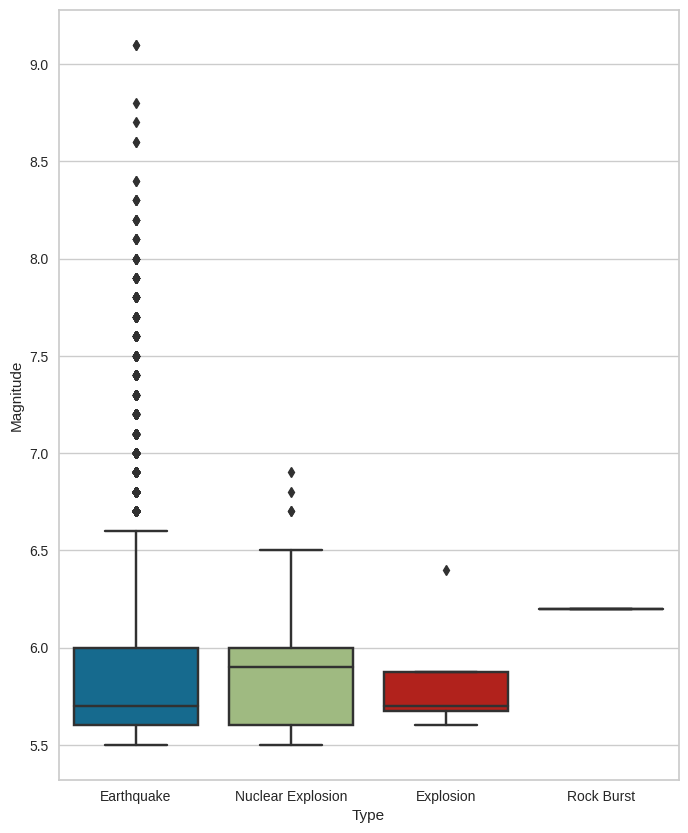

In [10]:
#Empleamos un Boxplot para revisar la distribución de la variable Type en base a las magnitudes
plt.figure(figsize=(8,10))
sns.boxplot(data = df, y = 'Magnitude', x = 'Type')
plt.show()

In [11]:
#Solo nos enfocamos en los terremotos, asi que eliminamos el ruido de los otros tipos de la columna "Type"
df = df[df['Type']=='Earthquake'].copy()
df

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
0,01/02/1965,13:44:18,19.2460,145.6160,Earthquake,131.60,NaN,NaN,6.0,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic
1,01/04/1965,11:29:49,1.8630,127.3520,Earthquake,80.00,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic
2,01/05/1965,18:05:58,-20.5790,-173.9720,Earthquake,20.00,NaN,NaN,6.2,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic
3,01/08/1965,18:49:43,-59.0760,-23.5570,Earthquake,15.00,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic
4,01/09/1965,13:32:50,11.9380,126.4270,Earthquake,15.00,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23407,12/28/2016,08:22:12,38.3917,-118.8941,Earthquake,12.30,1.2,40.0,5.6,ML,...,18.0,42.47,0.120,NaN,0.1898,NN00570710,NN,NN,NN,Reviewed
23408,12/28/2016,09:13:47,38.3777,-118.8957,Earthquake,8.80,2.0,33.0,5.5,ML,...,18.0,48.58,0.129,NaN,0.2187,NN00570744,NN,NN,NN,Reviewed
23409,12/28/2016,12:38:51,36.9179,140.4262,Earthquake,10.00,1.8,NaN,5.9,MWW,...,NaN,91.00,0.992,4.8,1.5200,US10007NAF,US,US,US,Reviewed
23410,12/29/2016,22:30:19,-9.0283,118.6639,Earthquake,79.00,1.8,NaN,6.3,MWW,...,NaN,26.00,3.553,6.0,1.4300,US10007NL0,US,US,US,Reviewed


# Primera pregunta - ¿Existe una relación entre la magnitud y la ubicación (latitud y longitud)?
Al observar la data graficada sobre un mapa, obtendremos una imagen familiar, donde las zonas de alta actividad sísmica se hacen notar fuertemente. La ubicación de los terremotos está fuertemente asociada a las zonas de confluencia tectónica, caracterizadas por su alta actividad. Fuera de estas zonas la actividad decae fuertemente.

In [12]:
#se define un tamaño de muestra para el grafico
limit = 500
df_incidents = df.iloc[0:limit, :]

In [13]:
# incidents = earthquake
df_incidents

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
0,01/02/1965,13:44:18,19.246,145.616,Earthquake,131.6,NaN,NaN,6.0,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic
1,01/04/1965,11:29:49,1.863,127.352,Earthquake,80.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic
2,01/05/1965,18:05:58,-20.579,-173.972,Earthquake,20.0,NaN,NaN,6.2,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic
3,01/08/1965,18:49:43,-59.076,-23.557,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic
4,01/09/1965,13:32:50,11.938,126.427,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,08/15/1966,02:45:36,13.295,121.467,Earthquake,19.8,NaN,NaN,6.0,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM844493,ISCGEM,ISCGEM,ISCGEM,Automatic
496,08/15/1966,10:20:40,3.487,64.014,Earthquake,10.0,NaN,NaN,6.0,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM844503,ISCGEM,ISCGEM,ISCGEM,Automatic
497,08/16/1966,02:16:20,36.395,70.903,Earthquake,196.4,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM844522,ISCGEM,ISCGEM,ISCGEM,Automatic
498,08/16/1966,18:02:36,37.380,-114.157,Earthquake,10.0,NaN,NaN,5.7,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM844550,ISCGEM,ISCGEM,ISCGEM,Automatic


In [14]:
#gráfico mapa-mundo
world_map = folium.Map()

incidents = folium.map.FeatureGroup()
# loop atraves de incidentes (Latitude, Longitude)
for lat, lng, in zip(df_incidents.Latitude, df_incidents.Longitude):
    incidents.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=5, # tamaño del circulo
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

# añadir texto a las etiquetas
latitudes = list(df_incidents.Latitude)
longitudes = list(df_incidents.Longitude)
labels = list(df_incidents.Type)

for lat, lng, label in zip(latitudes, longitudes, labels):
    folium.Marker([lat, lng], popup=label).add_to(world_map)

# añadir al mapa-mundo
world_map.add_child(incidents)

# Segunda pregunta - ¿Existe una relación entre la magnitud y la fecha?
Al observar la data a través del tiempo no obtendremos una relación evidente, e incluso si la separamos en hemisferios norte y sur. Sin embargo hoy contamos con modelos entrenados para reconocer patrones característicos de sismos de determinadas magnitudes, por lo que sí existiría una relación tiempo/magnitud, la cual radica en la distribución de las ondas percibidas.

In [15]:
#convertimos la variable "Date" y luego revisamos las fechas y magnitudes que comprende el dataset
df["Year"] = pd.to_datetime(df['Date'], utc = True).dt.year
print("Years from:", min(df['Year']), " to:", max(df['Year']))
print("Magnitude from:", min(df['Magnitude']), " to:", max(df['Magnitude']))

Years from: 1965  to: 2016
Magnitude from: 5.5  to: 9.1


Text(0.5, 0, 'Fecha')

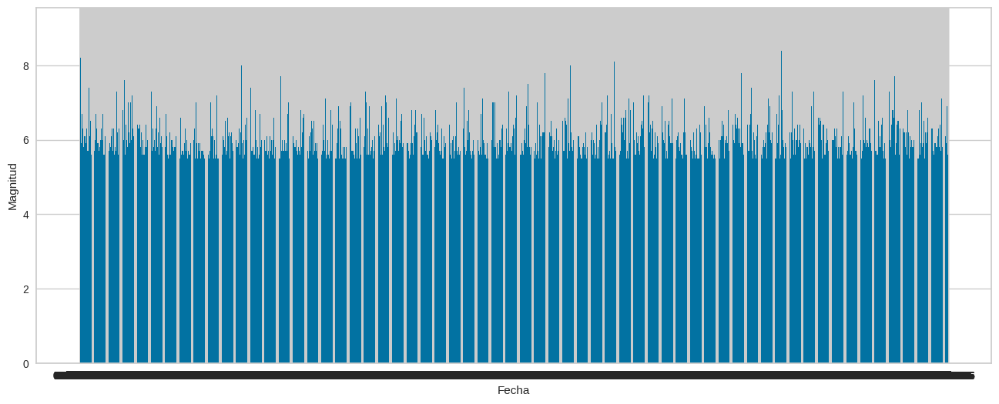

In [16]:
fig, ax = plt.subplots(figsize=(16,6))
ax.bar(df['Date'], df['Magnitude'])
ax.set_ylabel('Magnitud')
ax.set_xlabel('Fecha')

Text(0.5, 0, 'Fecha')

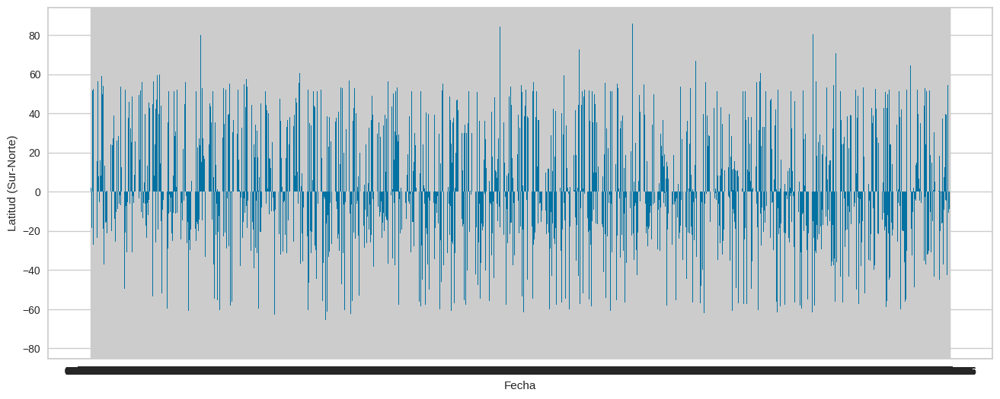

In [17]:
fig, ax = plt.subplots(figsize=(16,6))
ax.bar(df['Date'], df['Latitude'])
ax.set_ylabel('Latitud (Sur-Norte)')
ax.set_xlabel('Fecha')

# Tercera pregunta - ¿Existe una relación entre la magnitud y la profundidad?
En esta pregunta nos detendremos a analizar los datos con mayor detención, ya que a simple vista no se ve una relación evidente, pero a la vez también se observan zonas con alta densidad eventos, lo que sugiere la existencia de clusters ocultos dentro de los datos.

<Axes: xlabel='Depth', ylabel='Magnitude'>

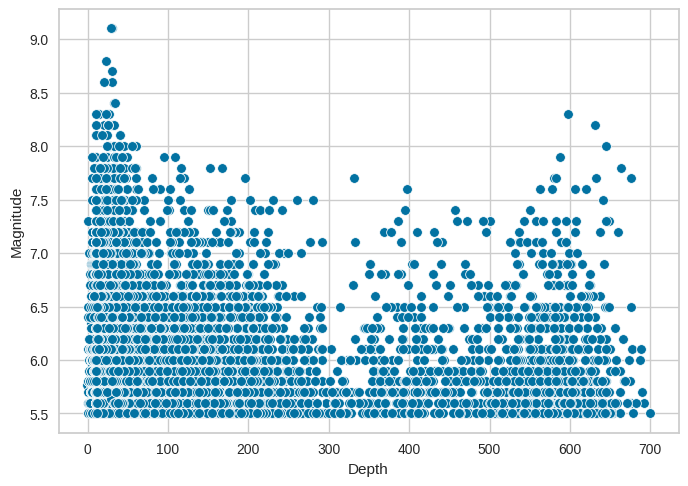

In [24]:
#Grafico de dispersión de profundidades y magnitudes de terremotos
sns.scatterplot(data=df, x="Depth", y="Magnitude")

<Axes: xlabel='Depth', ylabel='Magnitude'>

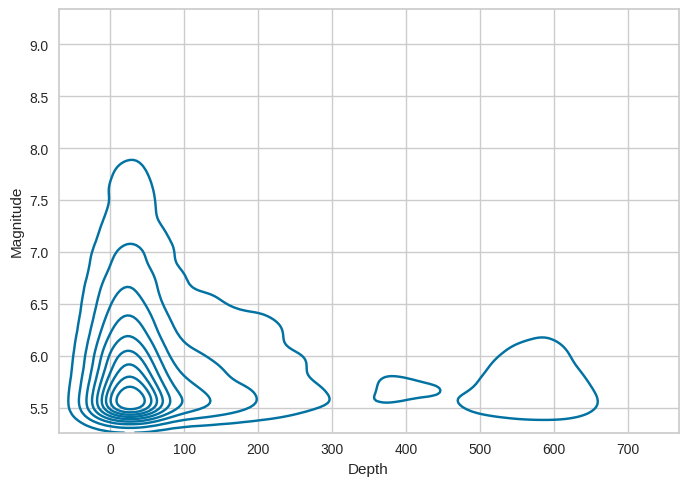

In [25]:
#Grafico KDE (Kernel density estimate)
sns.kdeplot(data = df , x="Depth", y="Magnitude")

Para identificar los clusters emplearemos k-means, un modelo de aprendizaje no supervisado.


De este proceso se obtendrán dos clusters, los cuales representan a su vez franjas de profundidad que agrupan terremotos.


In [38]:
#Separo las variables que usaremos en el análisis
X_num = df[['Magnitude','Depth']]

In [39]:
#Normalizamos los datos
X_num = preprocessing.normalize(X_num)
X_num

array([[0.04554539, 0.99896227],
       [0.07231021, 0.99738219],
       [0.29609877, 0.95515733],
       ...,
       [0.50814886, 0.86126926],
       [0.07949446, 0.99683531],
       [0.41838271, 0.90827083]])

In [40]:
#creamos una copia del dataframe
X = X_num.copy()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

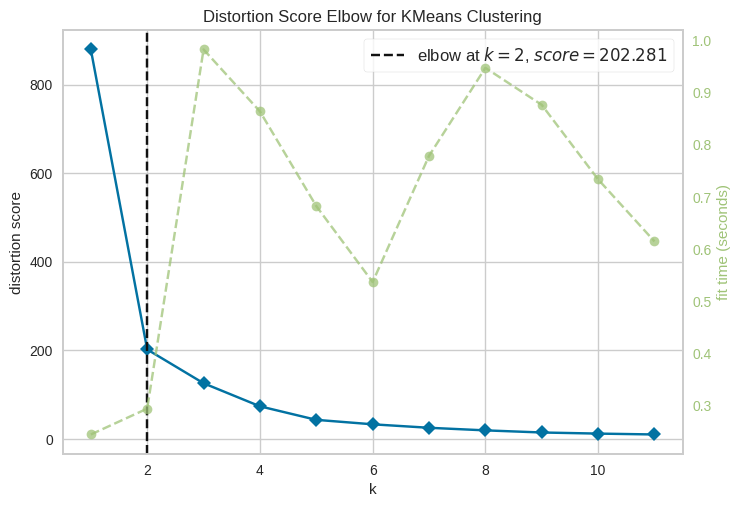

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [41]:
#metodo del codo para obtención de clusteres
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,12))
visualizer.fit(X)        # Entrenamos con los datos
visualizer.show()        # Renderizamos la imagen

In [42]:
#fit del algoritmo
kmeans = KMeans(n_clusters=2, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(X)

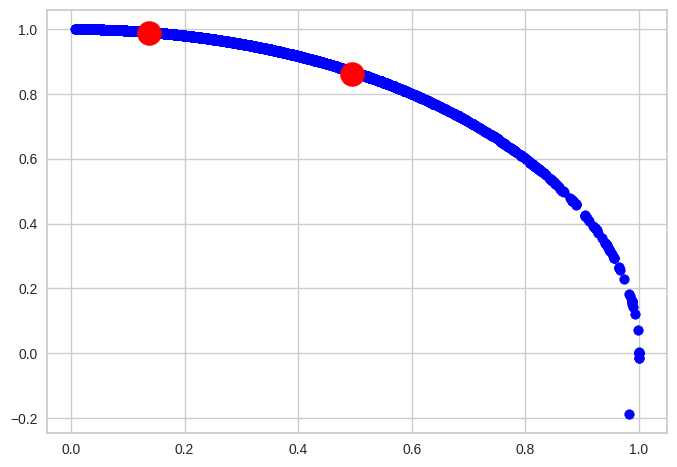

In [43]:
#diagrama de distribución
plt.scatter(X[:,0], X[:,1], c='blue')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='red')
plt.show()

# Otras variables de interés
En este estudio es posible verificar rápidamente algunas de estas relaciones, e incluso es posible obtener insights interesantes sobre relaciones no evidentes, y que es recomendable seguir estudiando más a fondo.

In [46]:
#Coeficientes de correlación entre las variables de la base de datos
df.corr()

<ipython-input-46-69aefd780305>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,Latitude,Longitude,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Error,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,Year
Latitude,1.000000,0.202677,-0.076290,-0.012784,0.438414,0.034615,-0.030944,0.291270,0.038636,-0.395453,-0.218702,-0.213346,-0.068768
Longitude,0.202677,1.000000,-0.086624,0.042013,0.012721,0.037433,-0.137488,0.136157,-0.228421,-0.134680,0.001797,-0.028343,-0.038421
Depth,-0.076290,-0.086624,1.000000,-0.068654,0.173686,0.023222,-0.041710,-0.004240,-0.172193,-0.075213,0.064871,-0.137930,-0.027528
Depth Error,-0.012784,0.042013,-0.068654,1.000000,-0.295481,-0.135597,0.372680,-0.071189,0.274018,-0.071166,0.232450,0.097543,-0.153554
Depth Seismic Stations,0.438414,0.012721,0.173686,-0.295481,1.000000,0.440356,-0.371709,0.810718,-0.419063,0.213721,-0.128924,-0.161474,0.242079
Magnitude,0.034615,0.037433,0.023222,-0.135597,0.440356,1.000000,0.171403,-0.029233,-0.237080,-0.094302,-0.067213,0.077234,-0.032649
Magnitude Error,-0.030944,-0.137488,-0.041710,0.372680,-0.371709,0.171403,1.000000,-0.353330,0.348455,-0.023219,0.040480,-0.172998,-0.325631
Magnitude Seismic Stations,0.291270,0.136157,-0.004240,-0.071189,0.810718,-0.029233,-0.353330,1.000000,-0.325111,-0.124504,0.004963,-0.165589,0.425278
Azimuthal Gap,0.038636,-0.228421,-0.172193,0.274018,-0.419063,-0.237080,0.348455,-0.325111,1.000000,-0.022447,0.074695,-0.063021,-0.331755
Horizontal Distance,-0.395453,-0.134680,-0.075213,-0.071166,0.213721,-0.094302,-0.023219,-0.124504,-0.022447,1.000000,0.396335,0.040576,0.106742


<ipython-input-47-5488ca7bdc23>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  mask = np.zeros_like(df.corr())
<ipython-input-47-5488ca7bdc23>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), mask=mask, annot=True, annot_kws={"size": 14})


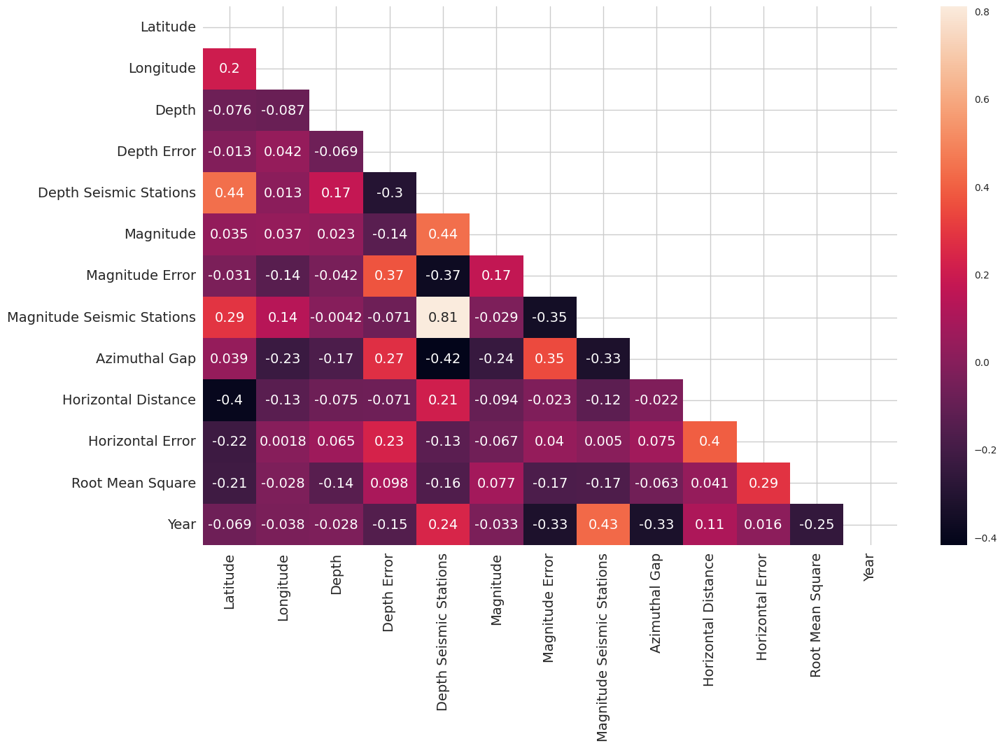

In [47]:
#mapa de calor con las correlaciones
mask = np.zeros_like(df.corr())
triangle_indices = np.triu_indices_from(mask)
mask[triangle_indices] = True
mask

plt.figure(figsize=(16,10))
sns.heatmap(df.corr(), mask=mask, annot=True, annot_kws={"size": 14})
sns.set_style('white')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

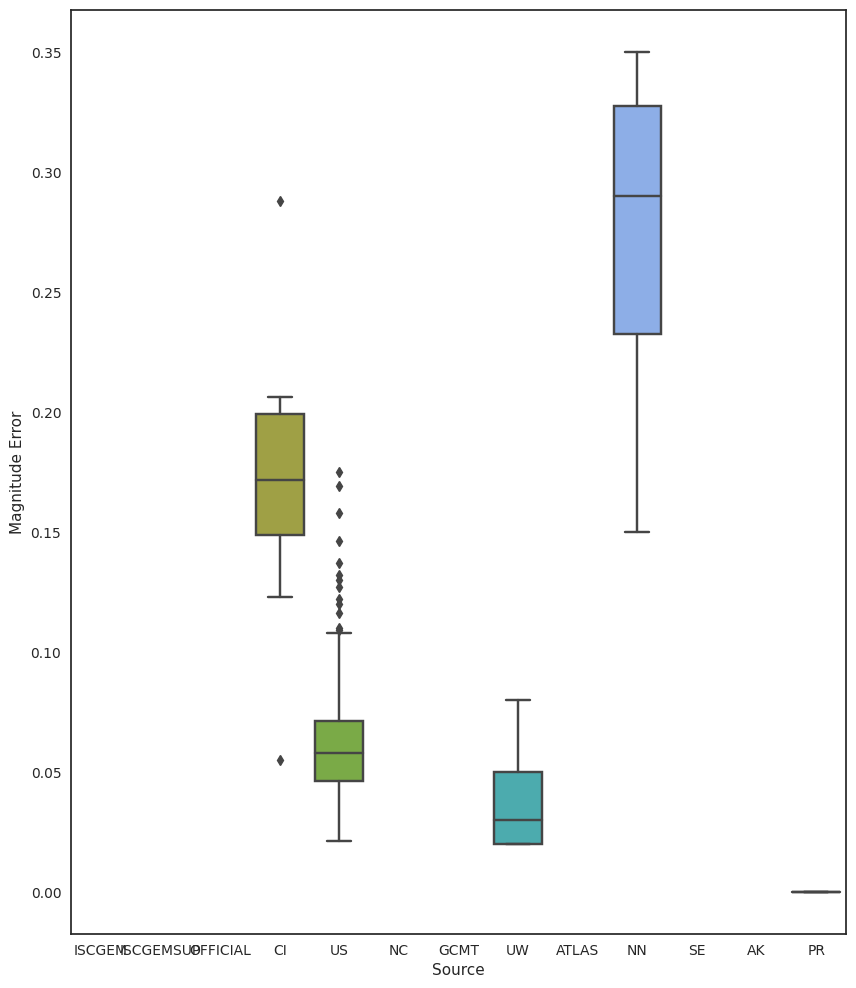

In [48]:
#Distribución de la variable "Magnitude error" en base a la variable "Source" , vía Boxplot
plt.figure(figsize=(10,12))
sns.boxplot(data = df, y = 'Magnitude Error', x = 'Source')
plt.show()

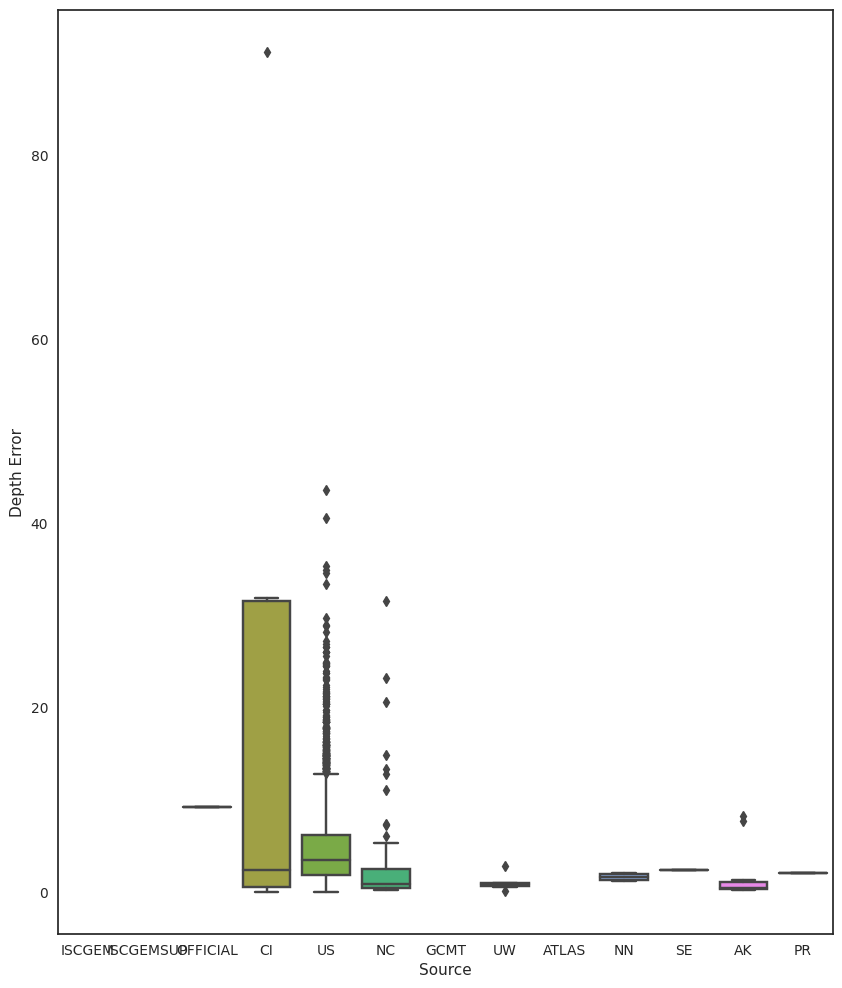

In [49]:
#Distribución de la variable "Depth error" en base a la variable "Source" , vía Boxplot
plt.figure(figsize=(10,12))
sns.boxplot(data = df, y = 'Depth Error', x = 'Source')
plt.show()

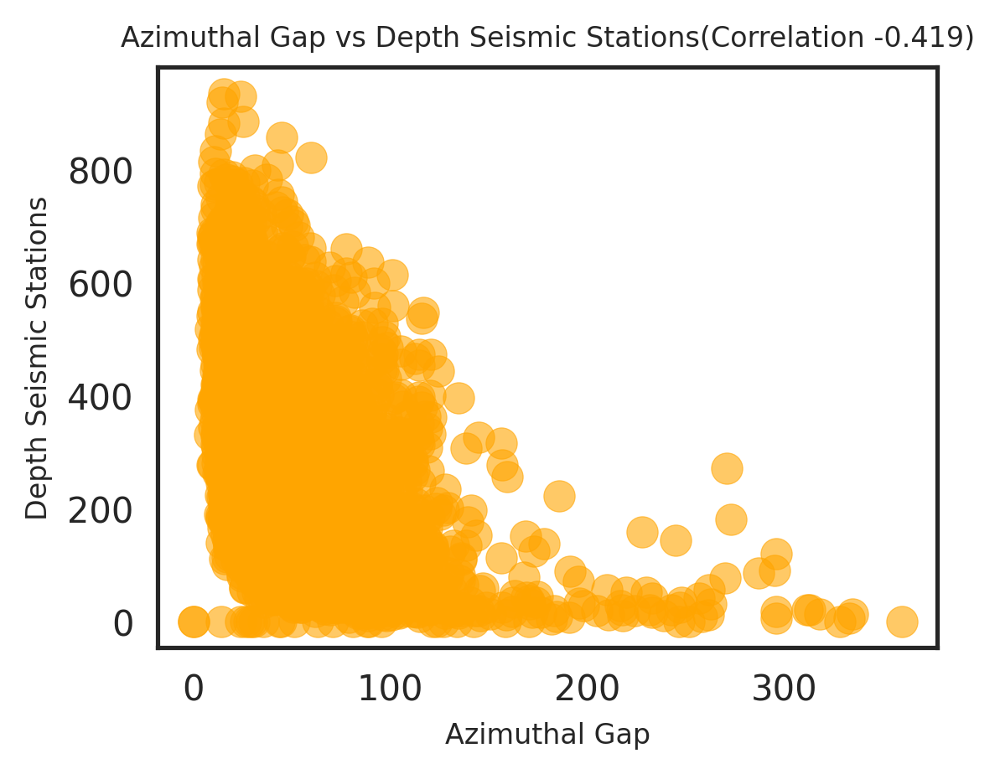

In [50]:
#Distribución de la variable "Depth seismic stations" en base a la variable "Azimuthal Gap"
az_error_corr = round(df['Azimuthal Gap'].corr(df['Depth Seismic Stations']), 3)

plt.figure(figsize=(4, 3), dpi=300)
plt.scatter(x=df['Azimuthal Gap'], y=df['Depth Seismic Stations'], alpha=0.6, s=80, color='orange')

plt.title(f'Azimuthal Gap vs Depth Seismic Stations(Correlation {az_error_corr})', fontsize=8)
plt.xlabel('Azimuthal Gap', fontsize=8)
plt.ylabel('Depth Seismic Stations', fontsize=8)
plt.show()

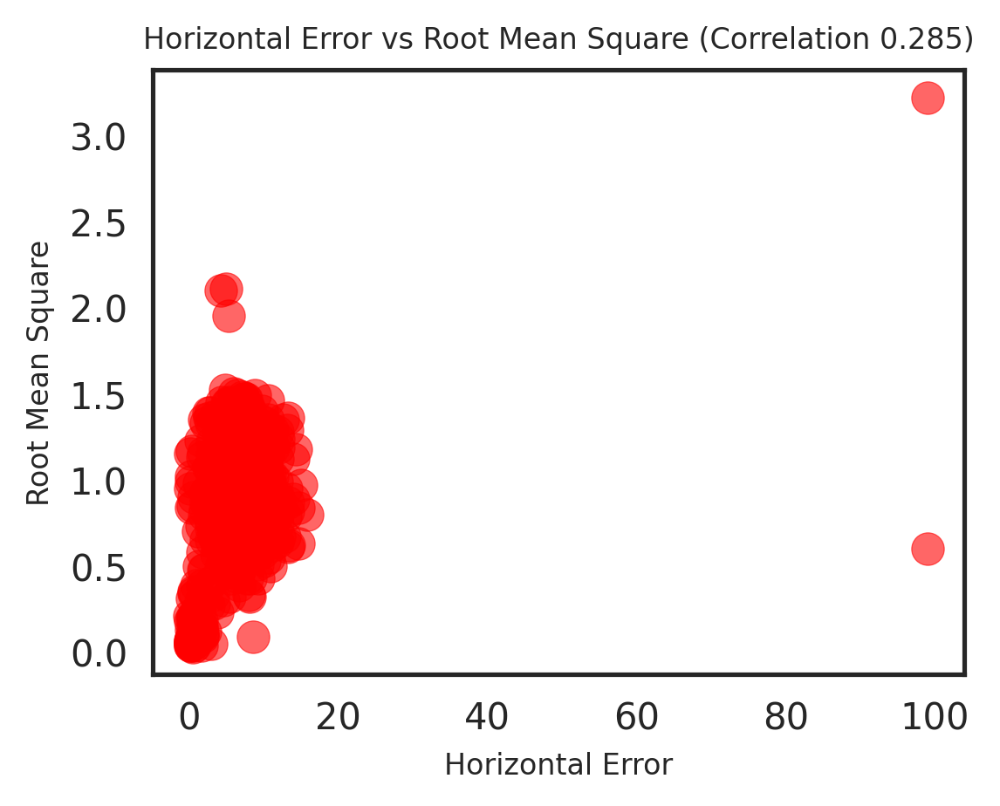

In [51]:
#Distribución de la variable "Horizontal Error" en base a la variable "Root Mean Square"
rms_error_corr = round(df['Horizontal Error'].corr(df['Root Mean Square']), 3)

plt.figure(figsize=(4, 3), dpi=300)
plt.scatter(x=df['Horizontal Error'], y=df['Root Mean Square'], alpha=0.6, s=80, color='red')

plt.title(f'Horizontal Error vs Root Mean Square (Correlation {rms_error_corr})', fontsize=8)
plt.xlabel('Horizontal Error', fontsize=8)
plt.ylabel('Root Mean Square', fontsize=8)
plt.show()

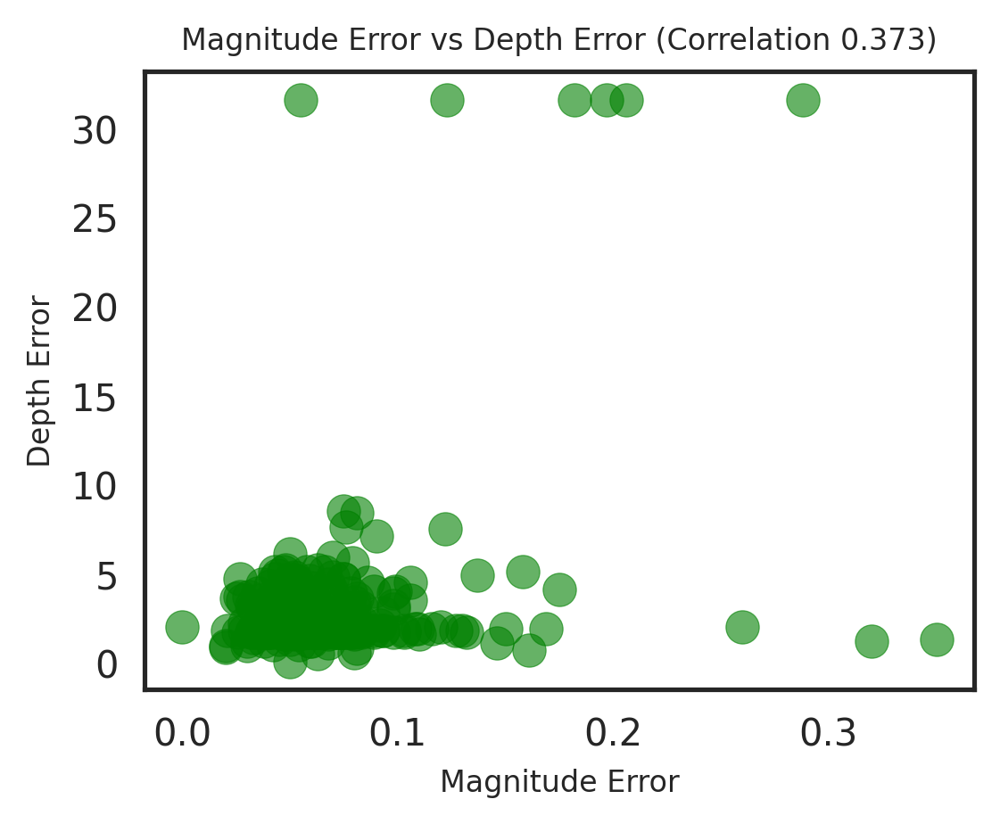

In [52]:
#Distribución de la variable "Magnitude Error" en base a la variable "Depth Error"
mag_depth_error_corr = round(df['Magnitude Error'].corr(df['Depth Error']), 3)

plt.figure(figsize=(4, 3), dpi=300)
plt.scatter(x=df['Magnitude Error'], y=df['Depth Error'], alpha=0.6, s=80, color='green')

plt.title(f'Magnitude Error vs Depth Error (Correlation {mag_depth_error_corr})', fontsize=8)
plt.xlabel('Magnitude Error', fontsize=8)
plt.ylabel('Depth Error', fontsize=8)
plt.show()

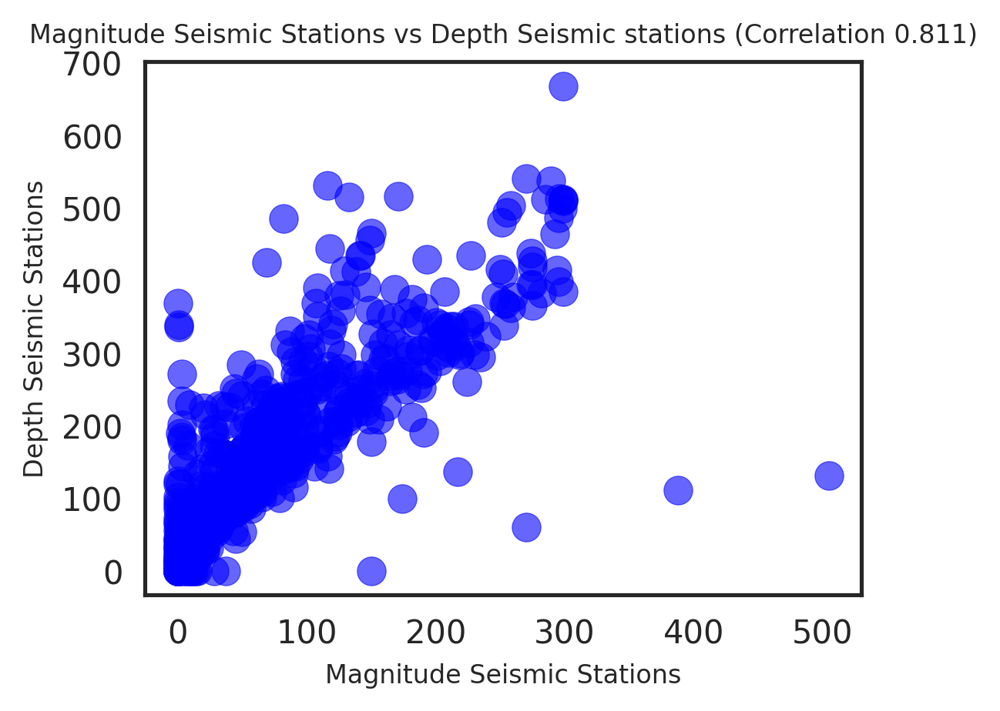

In [53]:
#Distribución de la variable "Magnitude seismic stations" en base a la variable "Depth Seismic stations"
mag_depth_corr = round(df['Magnitude Seismic Stations'].corr(df['Depth Seismic Stations']), 3)

plt.figure(figsize=(4, 3), dpi=300)
plt.scatter(x=df['Magnitude Seismic Stations'], y=df['Depth Seismic Stations'], alpha=0.6, s=80, color='blue')

plt.title(f'Magnitude Seismic Stations vs Depth Seismic stations (Correlation {mag_depth_corr})', fontsize=8)
plt.xlabel('Magnitude Seismic Stations', fontsize=8)
plt.ylabel('Depth Seismic Stations', fontsize=8)
plt.show()

Para finalizar confeccionaremos un profile report con la librería instalada al comienzo.

In [54]:
# Eliminamos las columnas que no que aportarian al reporte
df.drop(["Date", "Time", "Latitude", "Magnitude Type", "Longitude", "Type", "ID", "Source", "Location Source", "Magnitude Source", "Status"],
        axis = 1, inplace = True)
df.head()

,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Error,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,Year
0,131.6,NaN,NaN,6.0,NaN,NaN,NaN,NaN,NaN,NaN,1965
1,80.0,NaN,NaN,5.8,NaN,NaN,NaN,NaN,NaN,NaN,1965
2,20.0,NaN,NaN,6.2,NaN,NaN,NaN,NaN,NaN,NaN,1965
3,15.0,NaN,NaN,5.8,NaN,NaN,NaN,NaN,NaN,NaN,1965
4,15.0,NaN,NaN,5.8,NaN,NaN,NaN,NaN,NaN,NaN,1965


In [55]:
#Data Profiling
profile = pandas_profiling.ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]